# Testing co-location rate and spatial co-location rate

## Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from colocation.wang_colocation import WangColocation
from scipy.special import expit

## Functions

In [2]:
def find_col(user1: pd.DataFrame, user2: pd.DataFrame) -> pd.DataFrame:
    matching = user1.merge(user2, on=["x", "y", "time"])
    return matching

In [3]:
def find_scol(user1: pd.DataFrame, user2: pd.DataFrame) -> pd.DataFrame:
    matching = user1.merge(user2, on=["x", "y"])
    return matching

In [4]:
def make_traj_3d(plotting_data: pd.DataFrame, save_path: str = "",
                 calculate_scol: bool = False, 
                 calculate_col: bool = True) -> None:
    fig1 = px.line_3d(plotting_data, x="x", y="y", z="time", color="userID")

    user_x = plotting_data.loc[plotting_data["userID"]=="x", :]
    user_y = plotting_data.loc[plotting_data["userID"]=="y", :]

    col = find_col(user_x, user_y) if calculate_col else []
    scol = find_scol(user_x, user_y) if calculate_scol else []

    d = fig1.data

    if len(col) > 0:
        fig2 = px.scatter_3d(col, x="x", y="y", z="time", opacity=0.5)
        d = d + fig2.data
    if len(scol) > 0:
        fig3 = px.scatter_3d(scol, x="x", y="y", z="time_x", opacity=0.5)
        fig4 = px.scatter_3d(scol, x="x", y="y", z="time_y", opacity=0.5)
        d = d + fig3.data + fig4.data
    
    fig = go.Figure(data = d)

    camera = {"eye": {"x": -2, "y": -1.5, "z": 1}}
        
    fig.update_layout(scene=dict(xaxis_title="x",
                                 yaxis_title="y",
                                 zaxis_title="time"),
                      scene_camera=camera,
                      margin=dict(l=5, r=5, t=5, b=5),
                      width=600, height=600)

    if save_path.endswith(".html"):
        fig.write_html(save_path)
    if save_path.endswith(".pdf"):
        fig.write_image(save_path)

    return fig

In [5]:
def make_traj_animation(plotting_data: pd.DataFrame, save_path: str= "") -> None:
    xs = plotting_data["x"]
    ys = plotting_data["y"]
    fig = px.scatter(plotting_data, x="x", y="y",
                 animation_frame="time", animation_group="userID", color="userID",
                 range_x=[min(xs), max(xs)], range_y=[min(ys), max(ys)])

    if save_path.endswith(".html"):
        fig.write_html(save_path)

    fig.show()

In [6]:
def curve(row):
    x = row["x"]
    numerator = 1
    denominator = 1 + (x/(1-x))**(-1)
    return numerator / denominator

## Create datasets

## Dataset 1

For this dataset, there are two individuals.
Observations are collected for both individuals at every timestep.
The individuals cross paths once, i.e. at one specific timestep, they share the same location.
In this case, we would like for our colocation identification system to correctly identify this instance of colocation, and not identify any others.
For ease, the two individuals will move linearly across a square environment.

In [7]:
x_data = [{"userID": "x", "x": i, "y": i, "time": i} for i in range(10)]
y_data = [{"userID": "y", "x": i, "y": 10-i, "time": i} for i in range(10)]
data = x_data + y_data
data = pd.DataFrame(data)

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


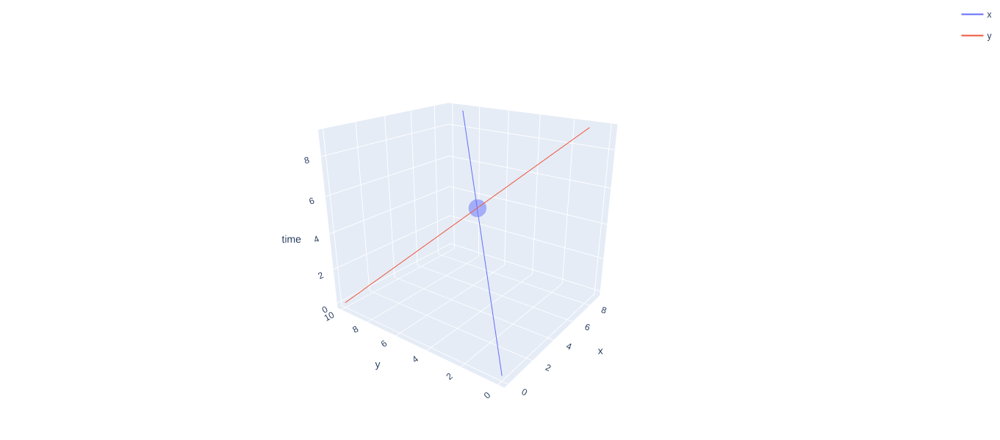

In [8]:
fig = make_traj_3d(data, save_path="figures/plotly_trajectory.pdf")
fig.show()

In [9]:
data.to_csv("data/data1.csv", index=False)

## Dataset 2

This dataset will be similar to the previous dataset.
In this dataset, however, the individuals will not move as linearly.

In [10]:
x_data = [{"userID": "x", "x": 0, "time": 0, "y": 0},
          {"userID": "x", "x": 1, "time": 1, "y": 0.5},
          {"userID": "x", "x": 2, "time": 2, "y": 1},
          {"userID": "x", "x": 3, "time": 3, "y": 2},
          {"userID": "x", "x": 4, "time": 4, "y": 4},
          {"userID": "x", "x": 5, "time": 5, "y": 5},
          {"userID": "x", "x": 6, "time": 6, "y": 7},
          {"userID": "x", "x": 7, "time": 7, "y": 8},
          {"userID": "x", "x": 8, "time": 8, "y": 8.5},
          {"userID": "x", "x": 9, "time": 9, "y": 9},
          {"userID": "x", "x": 10, "time": 10, "y": 10}]

x_data = pd.DataFrame(x_data)

y_data = x_data.copy()
y_data["userID"] = "y"
y_data["y"] = max(x_data["y"]) - x_data["y"]

data = pd.concat([x_data, y_data])

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



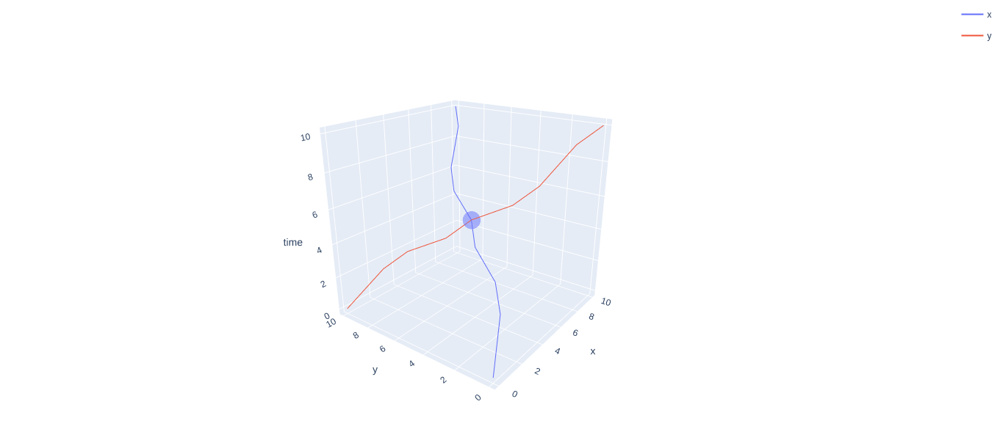

In [11]:
fig = make_traj_3d(data)
fig.show()

In [12]:
data.to_csv("data/data2.csv", index=False)

## Dataset 3

This dataset will be similar to Dataset 2, but data will not be collected with uniform frequency for each of the individauls.
This is achieved by taking a random sample of the overall data (but could also be achieved by taking a random sample of the constituent data for each of the individuals).

In [13]:
x_data = [{"userID": "x", "x": 0, "time": 0, "y": 0},
          {"userID": "x", "x": 1, "time": 1, "y": 0.5},
          {"userID": "x", "x": 2, "time": 2, "y": 1},
          {"userID": "x", "x": 3, "time": 3, "y": 2},
          {"userID": "x", "x": 4, "time": 4, "y": 4},
          {"userID": "x", "x": 5, "time": 5, "y": 5},
          {"userID": "x", "x": 6, "time": 6, "y": 7},
          {"userID": "x", "x": 7, "time": 7, "y": 8},
          {"userID": "x", "x": 8, "time": 8, "y": 8.5},
          {"userID": "x", "x": 9, "time": 9, "y": 9},
          {"userID": "x", "x": 10, "time": 10, "y": 10}]

x_data = pd.DataFrame(x_data)

y_data = x_data.copy()
y_data["userID"] = "y"
y_data["y"] = max(x_data["y"]) - x_data["y"]

data = pd.concat([x_data, y_data])

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



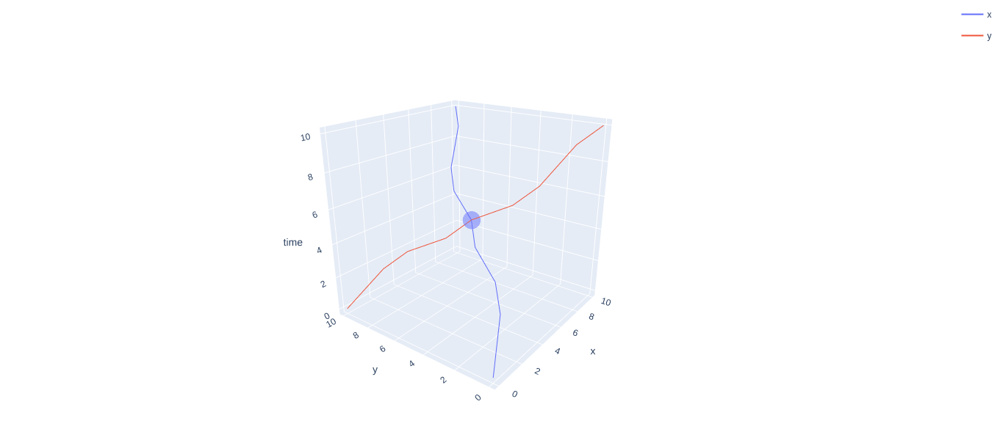

In [14]:
fig = make_traj_3d(data)
fig.show()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



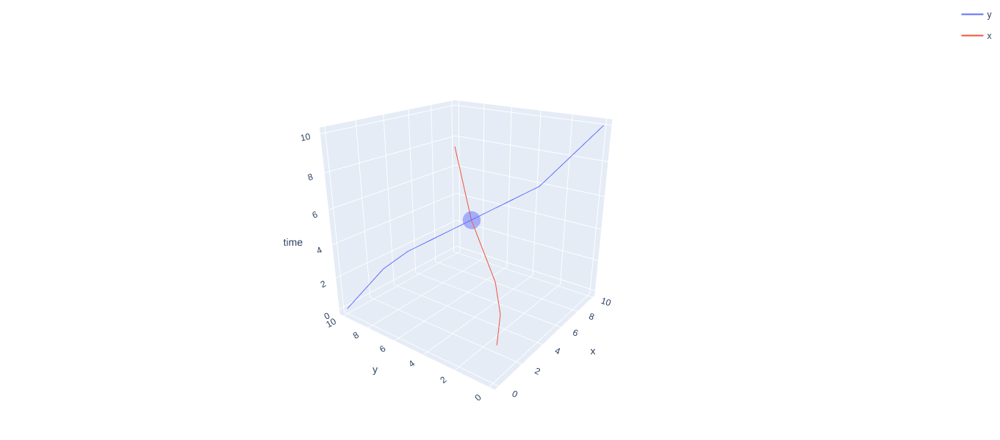

In [15]:
data = data.sample(frac=0.5).sort_index()
fig = make_traj_3d(data)
fig.show()

In [16]:
data.to_csv("data/data3.csv", index=False)

## Dataset 4

This dataset will collect data with uniform frequency.
However, instead of collecting $x-y$ coordinates for the individuals, the data will consist of specific location IDs and each location ID will have a given set of $x-y$ coordinates.

In [17]:
locations = [{"locationID": "0", "x": 0, "y": 0},
             {"locationID": "1", "x": 4, "y": 2},
             {"locationID": "2", "x": 6, "y": 8},
             {"locationID": "3", "x": 14, "y": 4},
             {"locationID": "4", "x": 8, "y": 16},
             {"locationID": "5", "x": 2, "y": 10},
             {"locationID": "6", "x": 16, "y": 20},
             {"locationID": "7", "x": 10, "y": 14},
             {"locationID": "8", "x": 18, "y": 6}]
locations = pd.DataFrame(locations)
locations.head()

,locationID,x,y
0,0,0,0
1,1,4,2
2,2,6,8
3,3,14,4
4,4,8,16


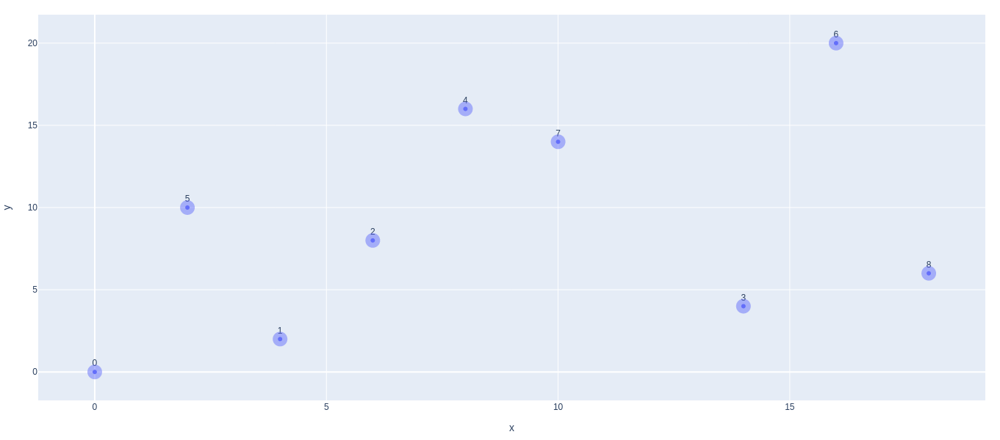

In [18]:
fig1 = px.scatter(locations,
                  x="x", y="y", 
                  text="locationID")
fig2 = px.scatter(locations,
                  x="x", y="y",
                  opacity=0.5)
fig2.update_traces(marker=dict(size=20))
fig = go.Figure(data=fig1.data+fig2.data)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20), 
                  width=600, height=600,
                  xaxis_title="x",
                  yaxis_title="y")
fig.update_traces(textposition="top center")
fig.show()
fig.write_image("figures/sensor_locations.pdf")

In [19]:
locations.to_csv("data/locations.csv", index=False)

In [20]:
data = [{"userID": "x", "locationID": "0", "time": 0},
        {"userID": "y", "locationID": "0", "time": 0},
        {"userID": "x", "locationID": "1", "time": 5},
        {"userID": "y", "locationID": "1", "time": 6},
        {"userID": "x", "locationID": "2", "time": 8},
        {"userID": "y", "locationID": "4", "time": 10},
        {"userID": "x", "locationID": "6", "time": 11},
        {"userID": "y", "locationID": "3", "time": 12},
        {"userID": "x", "locationID": "3", "time": 15},
        {"userID": "y", "locationID": "1", "time": 15},
        {"userID": "y", "locationID": "7", "time": 18},
        {"userID": "x", "locationID": "0", "time": 20},
        {"userID": "y", "locationID": "8", "time": 20},
        {"userID": "x", "locationID": "0", "time": 22},
        {"userID": "x", "locationID": "3", "time": 25}]
data = pd.DataFrame(data)
data.head()

,userID,locationID,time
0,x,0,0
1,y,0,0
2,x,1,5
3,y,1,6
4,x,2,8


In [21]:
data.to_csv("data/data.csv", index=False)

## Plot trajectories

In [22]:
plotting_data = pd.merge(left=data, right=locations, on="locationID", how="left")
plotting_data.head()

,userID,locationID,time,x,y
0,x,0,0,0,0
1,y,0,0,0,0
2,x,1,5,4,2
3,y,1,6,4,2
4,x,2,8,6,8


In [23]:
plotting_data

,userID,locationID,time,x,y
0,x,0,0,0,0
1,y,0,0,0,0
2,x,1,5,4,2
3,y,1,6,4,2
4,x,2,8,6,8
5,y,4,10,8,16
6,x,6,11,16,20
7,y,3,12,14,4
8,x,3,15,14,4
9,y,1,15,4,2


In [24]:
user_x = plotting_data.loc[plotting_data["userID"]=="x", :]
user_y = plotting_data.loc[plotting_data["userID"]=="y", :]

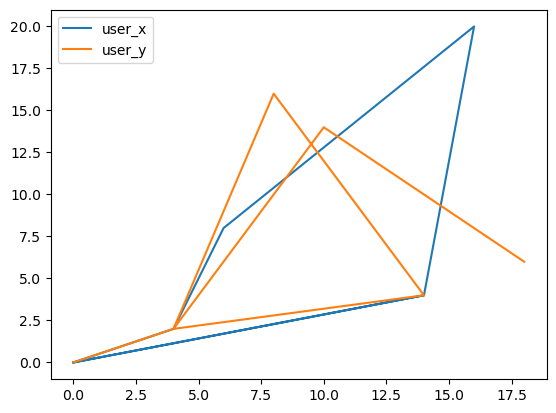

In [25]:
plt.figure()
plt.plot(user_x["x"], user_x["y"], label="user_x")
plt.plot(user_y["x"], user_y["y"], label="user_y")
plt.legend()
plt.savefig("figures/trajectories_2d.pdf")
plt.show()

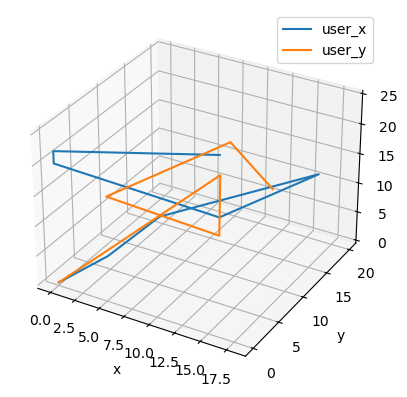

In [26]:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

ax.plot(user_x["x"], user_x["y"], zs=user_x["time"], label="user_x")
ax.plot(user_y["x"], user_y["y"], zs=user_y["time"], label="user_y")

plt.legend()
plt.xlabel("x")
plt.ylabel("y")

plt.savefig("figures/trajectories_3d.pdf")

plt.show()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



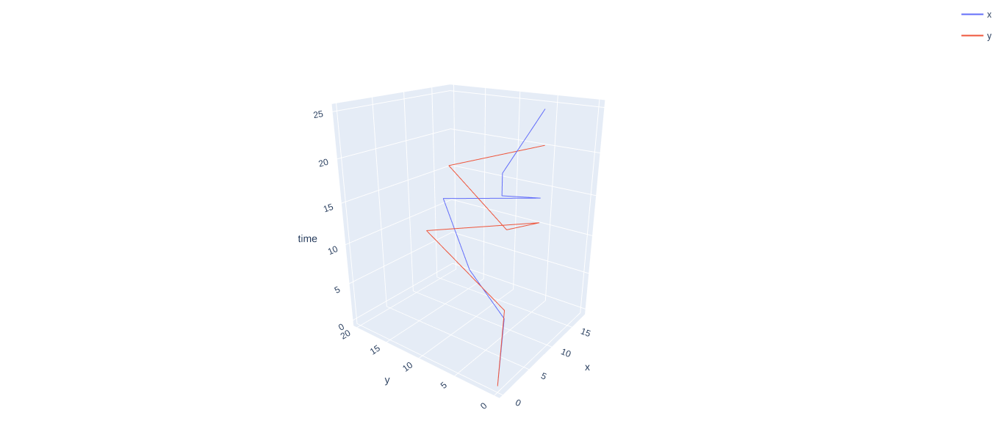

In [27]:
base_fig = make_traj_3d(plotting_data, calculate_col=False, calculate_scol=False, save_path="figures/plotly_trajectory.pdf")
base_fig.show()

In [28]:
col_fig = make_traj_3d(plotting_data)
scol_fig = make_traj_3d(plotting_data, calculate_scol=True)

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



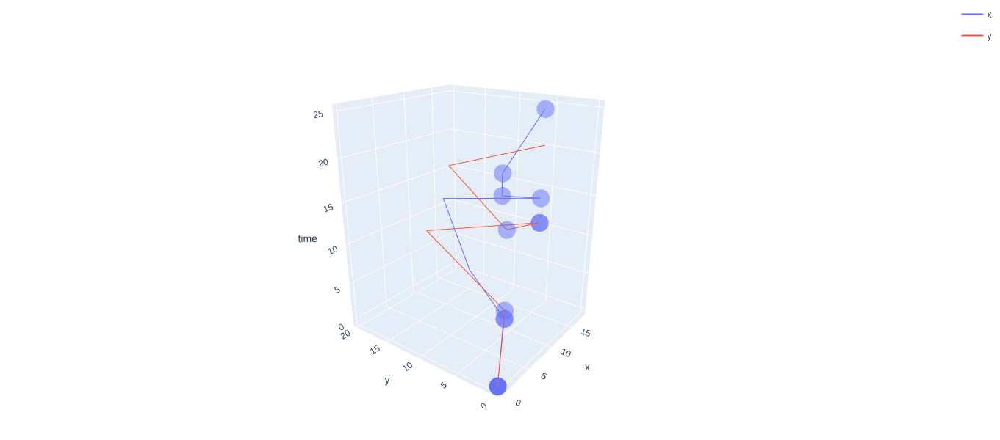

In [29]:
scol_fig.show()

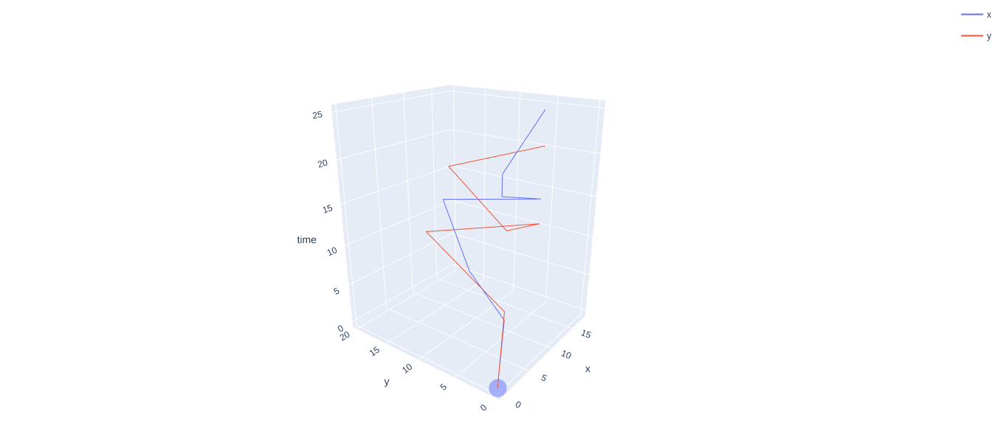

In [30]:
col_fig.show()

## Data 5

In [1]:
import skmob
import pandas as pd
import geopandas as gpd
from skmob.models.epr import DensityEPR

In [2]:
url = skmob.utils.constants.NY_COUNTIES_2011
tessellation = gpd.read_file(url)
start_time = pd.to_datetime('2019/01/01 08:00:00')
end_time = pd.to_datetime('2019/01/14 08:00:00')

In [3]:
tessellation.head()

,tile_id,population,geometry
0,36019,81716,"POLYGON ((-74.00667 44.88602, -74.02739 44.995..."
1,36101,99145,"POLYGON ((-77.09975 42.27421, -77.09966 42.272..."
2,36107,50872,"POLYGON ((-76.25015 42.29668, -76.24914 42.302..."
3,36059,1346176,"POLYGON ((-73.70766 40.72783, -73.70027 40.739..."
4,36011,79693,"POLYGON ((-76.27907 42.78587, -76.27535 42.780..."


In [4]:
depr = DensityEPR()

In [5]:
tdf = depr.generate(start_time, end_time, tessellation, relevance_column='population', n_agents=100, show_progress=True)

  0%|                                                                             | 0/100 [00:00<?, ?it/s]/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/models/gravity.py:43: RuntimeWarning: divide by zero encountered in power
  return np.power(x, exponent)
100%|███████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 27.57it/s]


In [6]:
tdf.plot_trajectory()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


In [7]:
tdf.head()

,uid,datetime,lat,lng
0,1,2019-01-01 08:00:00.000000,43.336049,-78.770842
1,1,2019-01-01 08:20:05.011976,43.382528,-78.230656
2,1,2019-01-01 08:49:41.263645,43.309133,-77.680414
3,1,2019-01-01 13:59:59.955628,43.382528,-78.230656
4,1,2019-01-01 14:38:21.836026,42.758231,-78.779632


In [8]:
u1 = tdf.loc[tdf["uid"]==1, :]

In [9]:
u1.shape

(161, 4)

In [10]:
u1.plot_trajectory()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


## Leeds, UK data

In [33]:
populations = pd.read_csv("data/populations_uk.csv")

In [34]:
populations.head()

,LSOA 2021 Code,LSOA 2021 Name,Total
0,E01011949,Hartlepool 009A,1866
1,E01011950,Hartlepool 008A,1094
2,E01011951,Hartlepool 007A,1240
3,E01011952,Hartlepool 002A,1620
4,E01011953,Hartlepool 002B,1979


In [35]:
gdf = gpd.read_file("data/lsoa_uk.geojson")

In [36]:
gdf.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,1,E01000001,City of London 001A,532123,181632,-0.097140,51.51816,ba0bf04c-03e6-4748-acf5-9dd1219c1860,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,2,E01000002,City of London 001B,532480,181715,-0.091970,51.51882,f4b205a5-5f68-4161-a014-5a2f51681597,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,3,E01000003,City of London 001C,532239,182033,-0.095320,51.52174,76c0a1fd-e446-4c40-9d5d-c98d689f23d5,"POLYGON ((532153.703 182165.155, 532158.250 18..."
3,4,E01000005,City of London 001E,533581,181283,-0.076270,51.51468,13d65a8b-5e13-443a-b355-5775794de964,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,5,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.53875,06953962-0ae1-417a-8357-b314a1fb5716,"POLYGON ((545126.852 184310.838, 545145.213 18..."


In [37]:
gdf = gdf.to_crs("4326")

In [38]:
leeds = gdf[gdf["LSOA21NM"].str.contains("Leeds")]

In [39]:
leeds

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
10719,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,8ec81958-1120-437e-944f-a2286a67cda6,"POLYGON ((-1.67829 53.87663, -1.67775 53.87654..."
10720,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,e7e168ad-5f19-447e-9174-ced7b8a66e51,"POLYGON ((-1.71803 53.87891, -1.71799 53.87886..."
10721,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,85fea36f-ed16-465f-8d18-1184fa5f5138,"POLYGON ((-1.73093 53.88634, -1.73086 53.88633..."
10722,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,be007189-7caf-49a4-a9cb-1d307e7786c6,"POLYGON ((-1.70324 53.87734, -1.70317 53.87675..."
10723,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,bda316ed-fbed-4cff-a83e-53d9f48286e5,"POLYGON ((-1.69055 53.87774, -1.69053 53.87759..."
...,...,...,...,...,...,...,...,...,...
33044,33045,E01035050,Leeds 105G,430214,426790,-1.54344,53.73664,95dabcf6-917e-4a34-bb40-4305366b41bc,"POLYGON ((-1.53163 53.74528, -1.53170 53.74520..."
33045,33046,E01035051,Leeds 105H,431335,427174,-1.52641,53.74003,bda7a4c4-ce3c-450a-81a4-8acb59dc413f,"POLYGON ((-1.53076 53.74532, -1.53067 53.74515..."
33046,33047,E01035052,Leeds 105I,431014,426532,-1.53134,53.73427,5b401df8-4923-45cc-a6fb-ddd21b8712cc,"POLYGON ((-1.52677 53.73906, -1.52731 53.73810..."
33047,33048,E01035053,Leeds 105J,432010,426253,-1.51627,53.73171,abb74970-9e4b-46de-b14e-038f5dc35450,"POLYGON ((-1.51279 53.73883, -1.51278 53.73883..."


In [40]:
leeds = leeds.merge(populations, how="inner",
                    left_on="LSOA21CD", right_on="LSOA 2021 Code")

In [41]:
leeds.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LSOA 2021 Code,LSOA 2021 Name,Total
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,8ec81958-1120-437e-944f-a2286a67cda6,"POLYGON ((-1.67829 53.87663, -1.67775 53.87654...",E01011264,Leeds 011A,1295
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,e7e168ad-5f19-447e-9174-ced7b8a66e51,"POLYGON ((-1.71803 53.87891, -1.71799 53.87886...",E01011265,Leeds 009A,1974
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,85fea36f-ed16-465f-8d18-1184fa5f5138,"POLYGON ((-1.73093 53.88634, -1.73086 53.88633...",E01011266,Leeds 008A,2615
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,be007189-7caf-49a4-a9cb-1d307e7786c6,"POLYGON ((-1.70324 53.87734, -1.70317 53.87675...",E01011267,Leeds 009B,1688
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,bda316ed-fbed-4cff-a83e-53d9f48286e5,"POLYGON ((-1.69055 53.87774, -1.69053 53.87759...",E01011268,Leeds 010A,1397


In [42]:
leeds.explore(column="Total")

In [43]:
depr = DensityEPR()

In [44]:
tdf = depr.generate(start_time, end_time, 
                    leeds, relevance_column='Total', 
                    n_agents=100, show_progress=True)

  0%|                                                                             | 0/100 [00:00<?, ?it/s]/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/models/gravity.py:43: RuntimeWarning: divide by zero encountered in power
  return np.power(x, exponent)
100%|███████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.08it/s]


In [45]:
tdf.plot_trajectory()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


In [46]:
tdf.head()

,uid,datetime,lat,lng
0,1,2019-01-01 08:00:00.000000,53.807815,-1.470387
1,1,2019-01-01 12:56:28.141088,53.813653,-1.457663
2,1,2019-01-02 12:47:42.058073,53.807815,-1.470387
3,1,2019-01-02 13:57:58.866294,53.813653,-1.457663
4,1,2019-01-02 15:57:43.582063,53.807815,-1.470387


In [47]:
u1 = tdf.loc[tdf["uid"]==1, :]

In [48]:
u2 = tdf.loc[tdf["uid"]==2, :]

In [49]:
u1.plot_trajectory()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


In [50]:
u2.plot_trajectory()

/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
/home/keiran/miniconda3/envs/coloc/lib/python3.12/site-packages/skmob/core/trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


In [55]:
from skmob.measures.individual import location_frequency

In [56]:
lf_df = location_frequency(tdf, normalize=False).reset_index()
lf_df

100%|██████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 399.06it/s]


,uid,lat,lng,location_frequency
0,1,53.831226,-1.453048,33
1,1,53.829912,-1.467793,31
2,1,53.807815,-1.470387,30
3,1,53.813653,-1.457663,15
4,1,53.827041,-1.455877,14
...,...,...,...,...
5122,100,53.825503,-1.516227,1
5123,100,53.825804,-1.508274,1
5124,100,53.834587,-1.642982,1
5125,100,53.837354,-1.522361,1


In [57]:
lf_df = location_frequency(tdf, normalize=True).reset_index() # frequencies ad probabilities
lf_df

100%|██████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 393.51it/s]


,uid,lat,lng,location_frequency
0,1,53.831226,-1.453048,0.144737
1,1,53.829912,-1.467793,0.135965
2,1,53.807815,-1.470387,0.131579
3,1,53.813653,-1.457663,0.065789
4,1,53.827041,-1.455877,0.061404
...,...,...,...,...
5122,100,53.825503,-1.516227,0.005102
5123,100,53.825804,-1.508274,0.005102
5124,100,53.834587,-1.642982,0.005102
5125,100,53.837354,-1.522361,0.005102


In [59]:
ranks = location_frequency(tdf, as_ranks=True) # as rank list
ranks[:10]

100%|██████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 350.62it/s]


[np.float64(0.13383010753404234),
 np.float64(0.10136928079901879),
 np.float64(0.08094908200888817),
 np.float64(0.06528011799050988),
 np.float64(0.05422174008678491),
 np.float64(0.04619973380004236),
 np.float64(0.03988760935615959),
 np.float64(0.03478854116173542),
 np.float64(0.031469806972501346),
 np.float64(0.028526289870993073)]